# sgis
https://github.com/statisticsnorway/ssb-sgis

Åpne heller notebooken her: https://nbviewer.org/github/statisticsnorway/intro_til_geopandas/blob/main/ssb_sgis.ipynb

In [1]:
# midlr.
import sys
sys.path.insert(0, r"C:\Users\ort\git\ssb-sgis\src")
import geopandas as gpd
import pandas as pd
import numpy as np
import sgis as sg

For å installere:

poetry add ssb-sgis

Eller:

pip install ssb-sgis

## Pakken inneholder:
- Funksjoner for bedre kartlegging
- Nettverksanalyse
- GIS-funksjoner som mangler i geopandas
- Forbedringer av geopandas-funksjoner

## Nettverksanalyse

In [2]:
veger_oslo = sg.read_parquet_url(
    "https://media.githubusercontent.com/media/statisticsnorway/ssb-sgis/main/tests/testdata/roads_oslo_2022.parquet"
)

veger_oslo = veger_oslo[["oneway", "drivetime_fw", "drivetime_bw", "roadid", "geometry"]]

nw = (
    sg.DirectedNetwork(veger_oslo)
    .remove_isolated()
    .make_directed_network_norway()
)

rules = sg.NetworkAnalysisRules(weight="minutes")

nwa = sg.NetworkAnalysis(network=nw, rules=rules)

nwa

NetworkAnalysis(
    network=DirectedNetwork(6364 km, percent_bidirectional=87),
    rules=NetworkAnalysisRules(weight=minutes, search_tolerance=250, search_factor=0, split_lines=False, ...),
    log=True, detailed_log=True,
)

In [3]:
punkter = sg.read_parquet_url(
    "https://media.githubusercontent.com/media/statisticsnorway/ssb-sgis/main/tests/testdata/points_oslo.parquet"
)

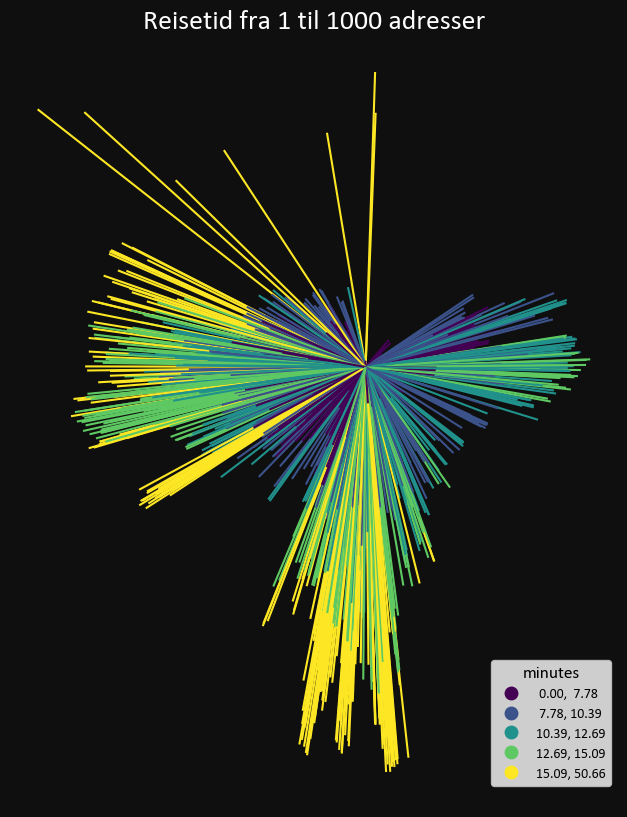

,origin,destination,minutes,geometry
0,870,1,4.953868,"LINESTRING (265896.900 6652734.100, 263122.700..."
1,870,2,10.397477,"LINESTRING (265896.900 6652734.100, 272456.100..."
2,870,3,7.215606,"LINESTRING (265896.900 6652734.100, 270082.300..."
3,870,4,12.302610,"LINESTRING (265896.900 6652734.100, 259804.800..."
4,870,5,12.099941,"LINESTRING (265896.900 6652734.100, 272876.200..."
...,...,...,...,...
995,870,996,10.324077,"LINESTRING (265896.900 6652734.100, 266801.700..."
996,870,997,7.541943,"LINESTRING (265896.900 6652734.100, 261274.000..."
997,870,998,13.210007,"LINESTRING (265896.900 6652734.100, 263542.900..."
998,870,999,8.999338,"LINESTRING (265896.900 6652734.100, 269226.700..."


In [4]:
od = nwa.od_cost_matrix(
    punkter.sample(1), 
    punkter, 
    id_col="idx",
    lines=True
)

sg.qtm(od, "minutes", title="Reisetid fra 1 til 1000 adresser", scheme="quantiles")

od

,origin,minutes,geometry
0,79166,1,MULTILINESTRING Z ((263122.461 6651267.381 46....
1,79166,2,MULTILINESTRING Z ((263585.029 6651794.619 74....
2,79166,3,MULTILINESTRING Z ((262750.930 6651840.320 63....
3,79166,4,MULTILINESTRING Z ((261565.090 6650650.323 35....
4,79166,5,MULTILINESTRING Z ((265378.000 6650581.600 85....
5,79166,6,MULTILINESTRING Z ((265262.829 6650519.242 78....
6,79166,7,MULTILINESTRING Z ((264348.673 6648271.134 17....
7,79166,8,MULTILINESTRING Z ((266903.800 6651086.560 114...
8,79166,9,MULTILINESTRING Z ((263683.620 6648172.520 20....
9,79166,10,MULTILINESTRING Z ((265657.500 6654844.860 296...


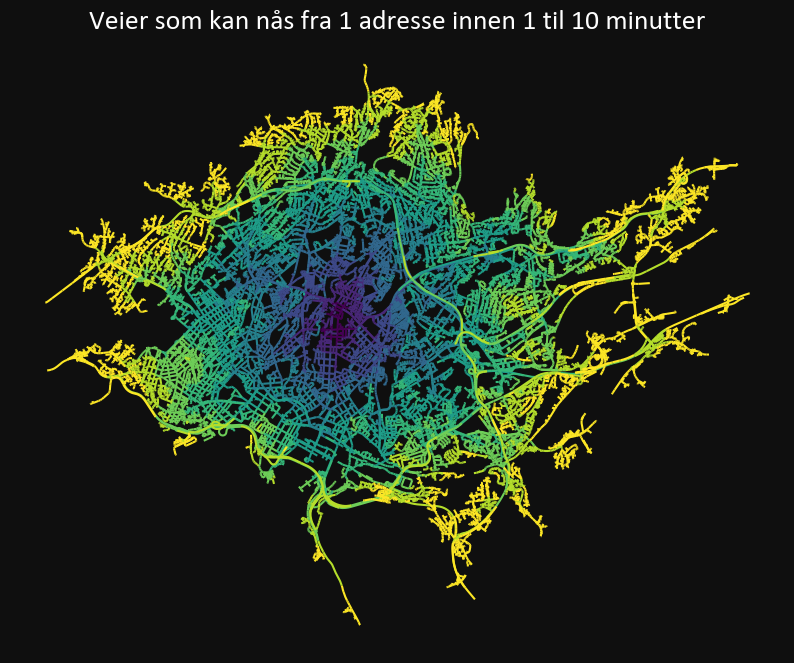

In [5]:
service_areas = nwa.service_area(
    punkter.iloc[[0]],
    breaks=np.arange(1, 11),
)

sg.qtm(service_areas, "minutes", k=10, title="Veier som kan nås fra 1 adresse innen 1 til 10 minutter", legend=False)

service_areas

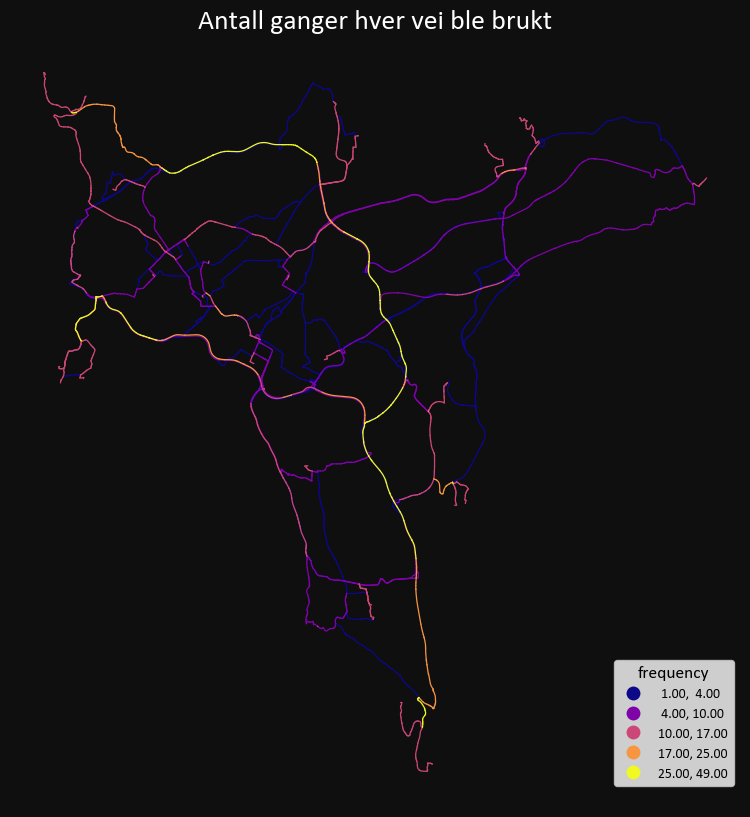

,connected,drivetime_bw,drivetime_fw,idx_orig,meters,minutes,frequency,n_source,n_target,oneway,roadid,source,source_wkt,target,target_wkt,geometry
151465,1.0,-1.0,NaN,1443508,5.730620,0.007908,49.0,2,3,FT,{E6},73801,POINT (265368.5999999996 6647142.9),73802,POINT (265371.4000000004 6647147.9),"LINESTRING Z (265368.600 6647142.900 131.660, ..."
151466,1.0,-1.0,NaN,1443516,4.827007,0.006661,49.0,3,3,FT,{E6},73802,POINT (265371.4000000004 6647147.9),73632,POINT (265372.5 6647152.6),"LINESTRING Z (265371.400 6647147.900 131.660, ..."
151463,1.0,-1.0,NaN,1443492,3.623534,0.005000,49.0,3,3,FT,{E6},73799,POINT (265359.5999999996 6647135.4),73800,POINT (265362.7999999998 6647137.1),"LINESTRING Z (265359.600 6647135.400 131.660, ..."


In [6]:
freq = nwa.get_route_frequencies(punkter.sample(15), punkter.sample(15))

sg.qtm(
    sg.buff(freq, 15),
    "frequency",
    scheme="naturalbreaks",
    cmap="plasma",
    title="Antall ganger hver vei ble brukt",
)

freq.sort_values("frequency", ascending=False).head(3)

,origin,destination,minutes,geometry
0,79166,79167,5.713765,MULTILINESTRING Z ((262623.190 6652506.640 79....
1,79166,79168,2.033578,MULTILINESTRING Z ((263164.500 6651132.400 40....
2,79166,79169,21.360853,MULTILINESTRING Z ((266999.100 6640759.200 133...
3,79166,79170,10.177600,MULTILINESTRING Z ((262623.190 6652506.640 79....
4,79166,79171,6.413928,MULTILINESTRING Z ((265611.900 6651045.190 94....
5,79166,79172,5.796754,MULTILINESTRING Z ((263171.800 6651250.200 46....
6,79166,79173,7.252490,MULTILINESTRING Z ((263171.800 6651250.200 46....
7,79166,79174,10.972780,MULTILINESTRING Z ((270133.477 6650701.318 190...
8,79166,79175,9.763825,MULTILINESTRING Z ((265133.360 6647245.720 127...
9,79166,79176,11.100900,MULTILINESTRING Z ((260679.000 6651295.200 48....


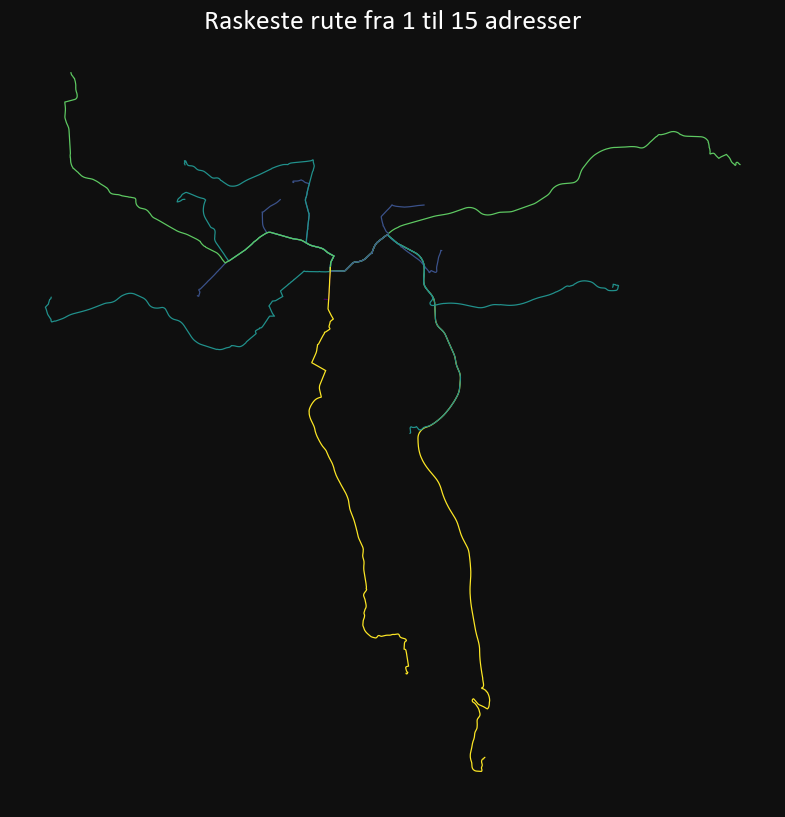

In [7]:
routes = nwa.get_route(
    punkter.iloc[[0]], 
    punkter.sample(15),
)

sg.qtm(sg.buff(routes, 15), "minutes", title="Raskeste rute fra 1 til 15 adresser", legend=False)

routes

,origin,destination,minutes,k,geometry
0,79166,79167,13.039830,1,MULTILINESTRING Z ((272281.367 6653079.745 160...
1,79166,79167,14.238108,2,MULTILINESTRING Z ((272281.367 6653079.745 160...
2,79166,79167,20.139294,3,MULTILINESTRING Z ((272281.367 6653079.745 160...
3,79166,79167,23.506778,4,MULTILINESTRING Z ((265226.515 6650674.617 88....


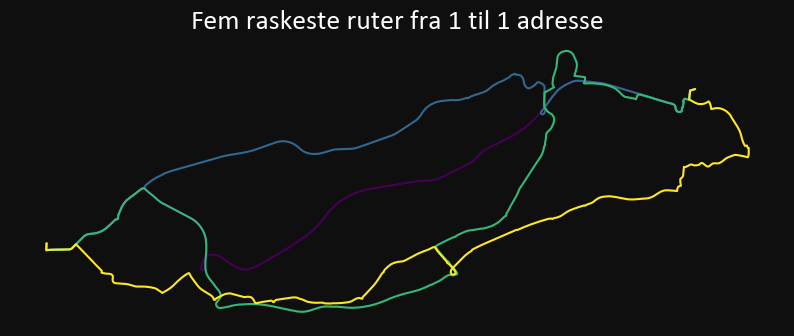

In [8]:
routes = nwa.get_k_routes(
    punkter.iloc[[0]], punkter.iloc[[1]], k=5, drop_middle_percent=50
)

sg.qtm(sg.buff(routes, 15), "k", title="Fem raskeste ruter fra 1 til 1 adresse", legend=False)

routes

In [9]:
nwa.log

,endtime,minutes_elapsed,method,origins_count,destinations_count,percent_missing,cost_mean,isolated_removed,percent_bidirectional,weight,...,cost_p25,cost_median,cost_p75,cost_std,lines,cutoff,destination_count,rowwise,breaks,dissolve
0,2023-03-23 14:14:28,0.2,od_cost_matrix,1,1000.0,0.4,11.759782,True,87,minutes,...,8.402587,11.408459,14.418625,4.867689,True,None,None,False,NaN,NaN
1,2023-03-23 14:14:38,0.2,service_area,1,NaN,0.0,5.500000,True,87,minutes,...,3.250000,5.500000,7.750000,3.027650,NaN,None,None,NaN,"1, 2, 3, 4, 5, 6, 7, 8, 9, 10",True
2,2023-03-23 14:15:00,0.3,get_route_frequencies,15,15.0,0.0,0.069461,True,87,minutes,...,0.012857,0.038784,0.089414,0.092572,NaN,None,None,NaN,NaN,NaN
3,2023-03-23 14:15:16,0.2,get_route,1,15.0,0.0,10.814385,True,87,minutes,...,6.519387,10.177600,14.106631,5.561609,NaN,None,None,False,NaN,NaN
4,2023-03-23 14:15:27,0.2,get_k_routes,1,1.0,0.0,17.731003,True,87,minutes,...,13.938539,17.188701,20.981165,4.945262,NaN,None,None,False,NaN,NaN


# Kartlegging

Lager fem GeoDataFrames med et utvalg av punktene, bufrer, lager areal-kolonne:

In [10]:
punkter100 = sg.buff(punkter.sample(40), 100).assign(areal=lambda df: df.area)
punkter200 = sg.buff(punkter.sample(30), 200).assign(areal=lambda df: df.area)
punkter300 = sg.buff(punkter.sample(20), 300).assign(areal=lambda df: df.area)
punkter400 = sg.buff(punkter.sample(10), 400).assign(areal=lambda df: df.area)
punkter500 = sg.buff(punkter.sample(5), 500).assign(areal=lambda df: df.area)

Her er geopandas' explore med to GeoDataFrames:

In [11]:
pd.concat(
    [
    punkter100.assign(label="punkter100"), 
    punkter200.assign(label="punkter200")
    ]
).explore("label")

Her er et alternativ:

In [12]:
sg.explore(punkter200, punkter100)

#### sgis.explore: Interaktivt kart av én eller flere GeoDataFrames.
- Kan huke av/på kartlagene
- Flere bakgrunnskart
- Bedre fargepalett
- Kan zoome mer

In [13]:
sg.explore(punkter500, punkter400, punkter300, punkter200, punkter100)

In [14]:
sg.explore(punkter500, punkter400, punkter300, punkter200, punkter100, "areal")

In [15]:
sg.explore(punkter500, punkter400, punkter300, punkter200, punkter100, "areal")

Hvis dataene er for tunge til å vises samtidig.

Først lag en kolonne for vegtype.

In [16]:
veger_oslo["category"] = veger_oslo.roadid.str[1] # henter ut bokstav nr 2
veger_oslo[["category", "roadid"]]

,category,roadid
119702,S,{S944}
199710,R,{R163}
199725,R,{R163}
199726,R,{R163}
199733,R,{R163}
...,...,...
1944129,R,{R191}
1944392,P,{P10977}
1944398,P,{P11967}
1944409,P,{P11967}


Kartlegg tilfeldig område.

In [17]:
sg.samplemap(veger_oslo, "category")

Kartlegg utvalgt område.

In [18]:
maske = punkter.iloc[[0]].buffer(300)
sg.clipmap(veger_oslo, "category", mask=maske)

### sg.qtm
Samme som explore, men statisk kart.

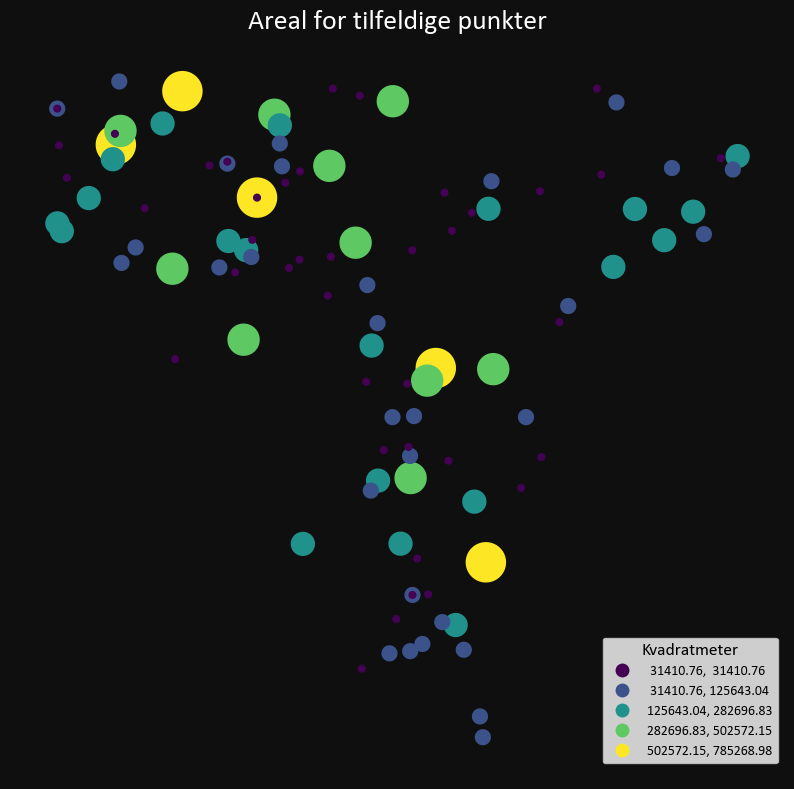

(<Figure size 1000x1000 with 1 Axes>,
 <Axes: title={'center': 'Areal for tilfeldige punkter'}>)

In [19]:
sg.qtm(
    punkter500, punkter400, punkter300, punkter200, punkter100, 
    column="areal", 
    title="Areal for tilfeldige punkter", 
    legend_title="Kvadratmeter", 
)

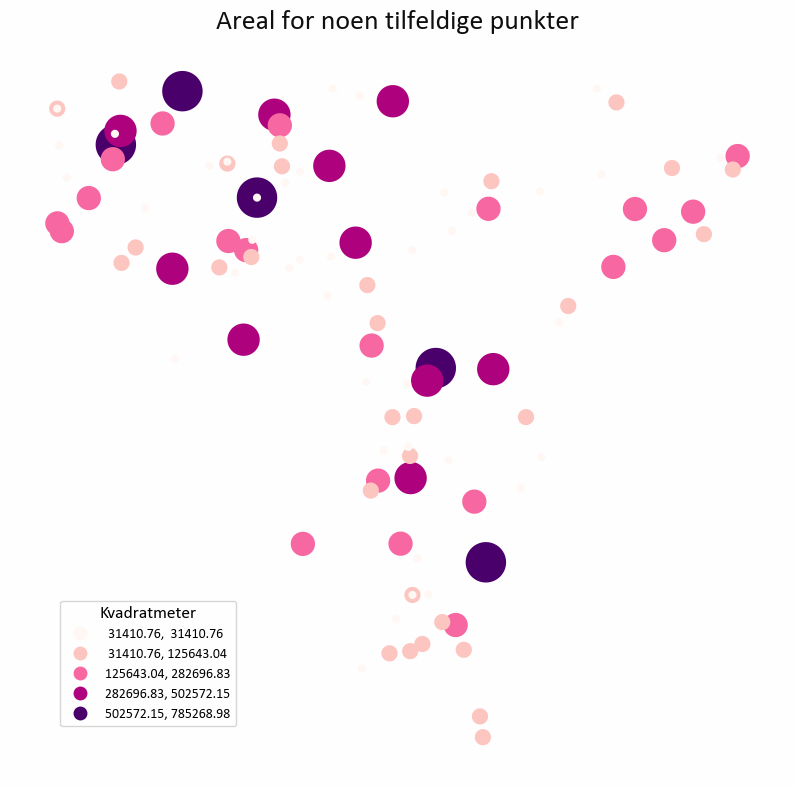

(<Figure size 1000x1000 with 1 Axes>,
 <Axes: title={'center': 'Areal for noen tilfeldige punkter'}>)

In [20]:
sg.qtm(
    punkter500, punkter400, punkter300, punkter200, punkter100, 
    column="areal", 
    title="Areal for noen tilfeldige punkter", 
    legend_title="Kvadratmeter", 
    bbox_to_anchor=(0.3, 0.25), # flytte legend-en
    cmap="RdPu",
    black=False,
)

Legge til bakgrunnskart.

In [21]:
import geopandas as gpd
kommuner_uten_hav = gpd.read_parquet(
    r"C:\Users\ort\OneDrive - Statistisk sentralbyrå\data\ABAS_kommune_utenhav_p2023_v1.parquet", 
    filters=[("KOMMUNENR", "in", ['0301', '3023', '3024', '3029','3020', '3030', '3031'])]
)

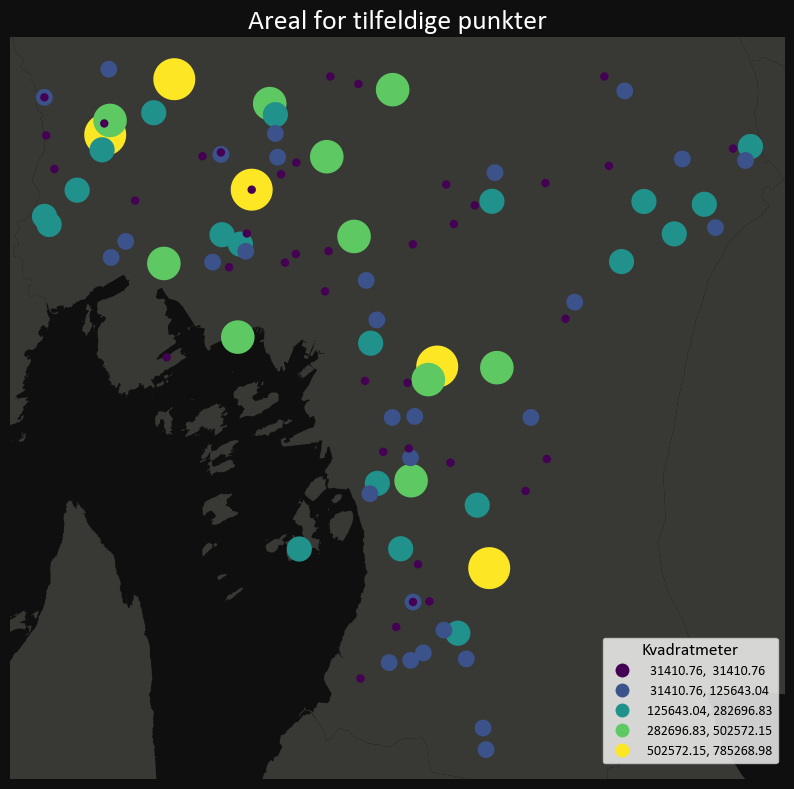

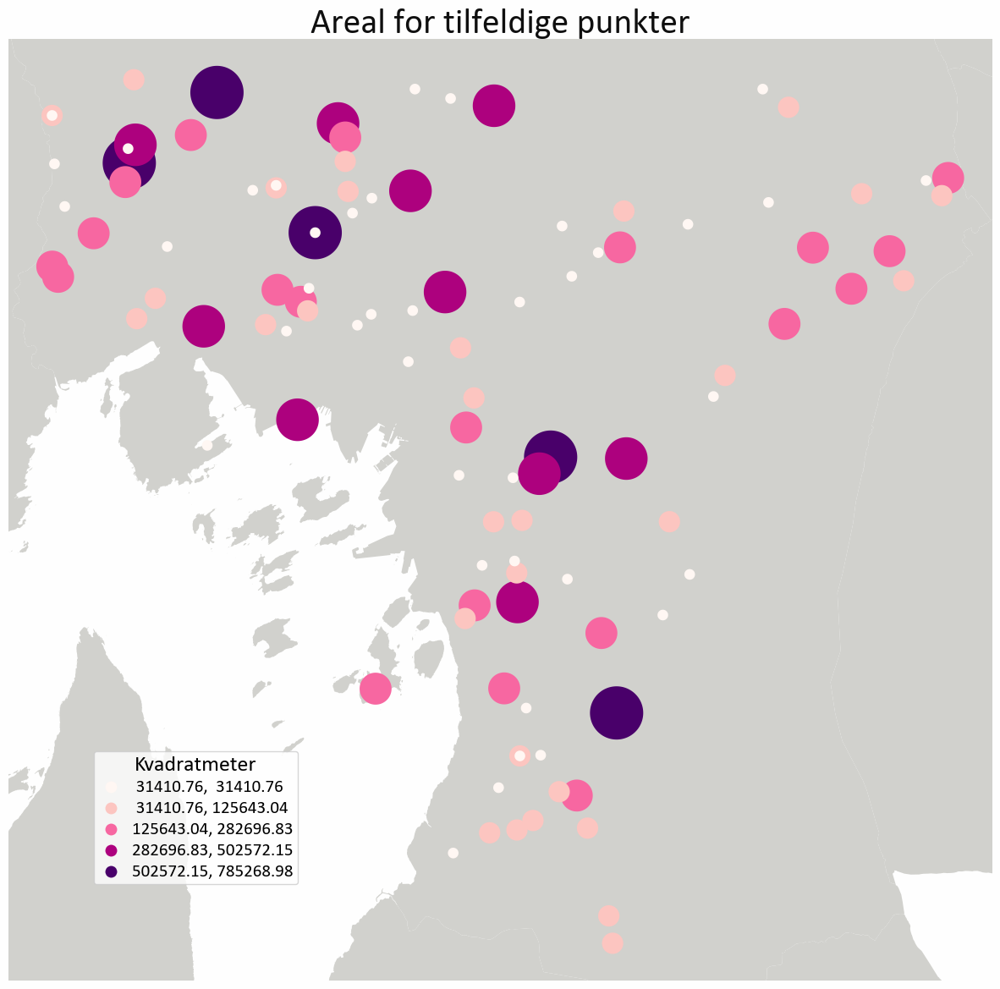

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: title={'center': 'Areal for tilfeldige punkter'}>)

In [22]:
sg.qtm(
    punkter500, punkter400, punkter300, punkter200, punkter100,
    bg_gdf=kommuner_uten_hav,
    column="areal", 
    title="Areal for tilfeldige punkter", 
    legend_title="Kvadratmeter", 
    black=True,
)

sg.qtm(
    punkter500, punkter400, punkter300, punkter200, punkter100, 
    bg_gdf=kommuner_uten_hav,
    column="areal", 
    title="Areal for tilfeldige punkter", 
    legend_title="Kvadratmeter", 
    cmap="RdPu",
    black=False,
    bbox_to_anchor=(0.3,0.25), # flytte legend-en
    size=15,
)

## GIS-funksjoner som mangler i geopandas

### Feature to line
Gjør én eller flere GeoDataFrames til linjer.

In [23]:
import sgis as sg
from shapely.geometry import Polygon
poly1 = sg.to_gdf(Polygon([(0, 0), (0, 1), (1, 1), (1, 0)]))
poly1["poly1"] = 1
poly1

,geometry,poly1
0,"POLYGON ((0.00000 0.00000, 0.00000 1.00000, 1....",1


In [24]:
line = sg.to_lines(poly1)
line

,poly1,geometry
0,1,"LINESTRING (0.00000 0.00000, 0.00000 1.00000, ..."


In [25]:
poly2 = sg.to_gdf(Polygon([(0.5, 0.5), (0.5, 1.5), (1.5, 1.5), (1.5, 0.5)]))
poly2["poly2"] = 1

lines = sg.to_lines(poly1, poly2)

lines

,poly1,poly2,geometry
0,1.0,NaN,"LINESTRING (0.00000 0.00000, 0.00000 1.00000, ..."
1,1.0,NaN,"LINESTRING (0.50000 1.00000, 1.00000 1.00000, ..."
2,1.0,NaN,"LINESTRING (1.00000 0.50000, 1.00000 0.00000, ..."
3,NaN,1.0,"LINESTRING (0.50000 0.50000, 0.50000 1.00000)"
4,NaN,1.0,"LINESTRING (0.50000 1.00000, 0.50000 1.50000, ..."
5,NaN,1.0,"LINESTRING (1.00000 0.50000, 0.50000 0.50000)"


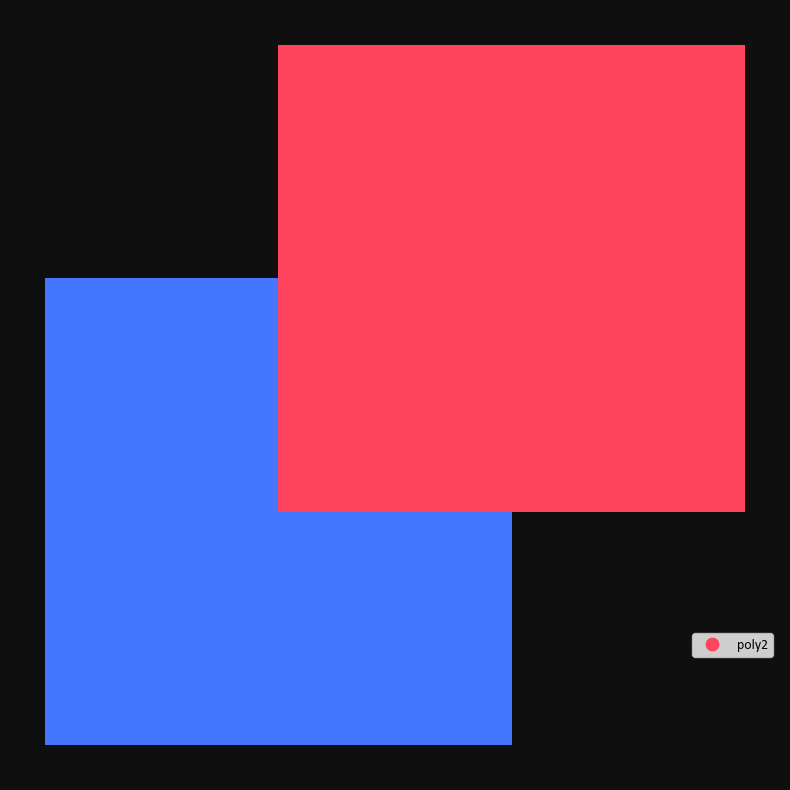

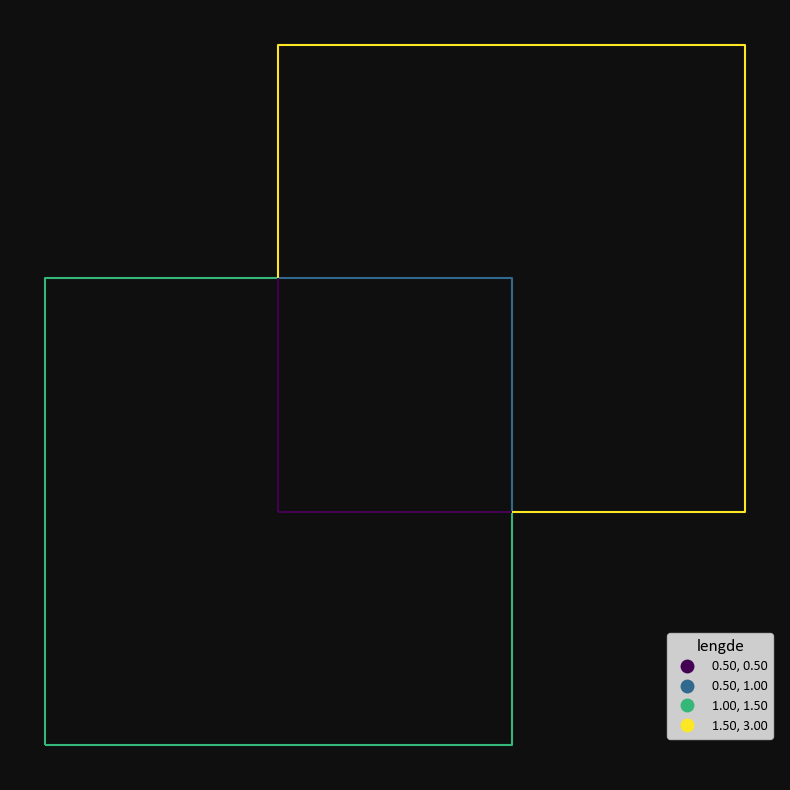

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [26]:
sg.qtm(poly1, poly2)
lines["lengde"] = lines.length
sg.qtm(lines, "lengde")

### Tette hull i polygoner
Lager et polygon med to hull.

In [27]:
kommuner = gpd.read_file(r"C:\Users\ort\OneDrive - Statistisk sentralbyrå\data\ABAS_kommune_flate_p2023_v1.gpkg")
kommuner = kommuner[["KOMMUNENR", "FYLKE", "geometry"]]

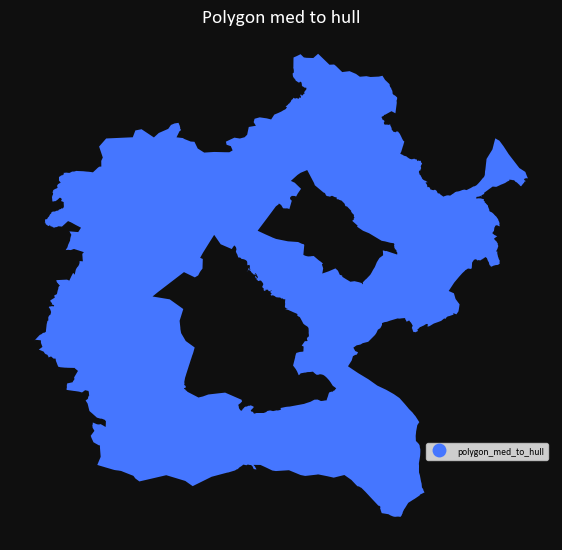

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Polygon med to hull'}>)

In [28]:
hol = kommuner.loc[kommuner.KOMMUNENR == "3044"]
hols_naboer = kommuner.loc[kommuner.touches(hol.unary_union)]

hemsedal = kommuner.loc[kommuner.KOMMUNENR == "3042"]
hemsedals_naboer = kommuner.loc[kommuner.touches(hemsedal.unary_union)]

polygon_med_to_hull = sg.gdf_concat([hols_naboer, hemsedals_naboer]).pipe(sg.dissexp)

sg.qtm(polygon_med_to_hull, title="Polygon med to hull", size=7)

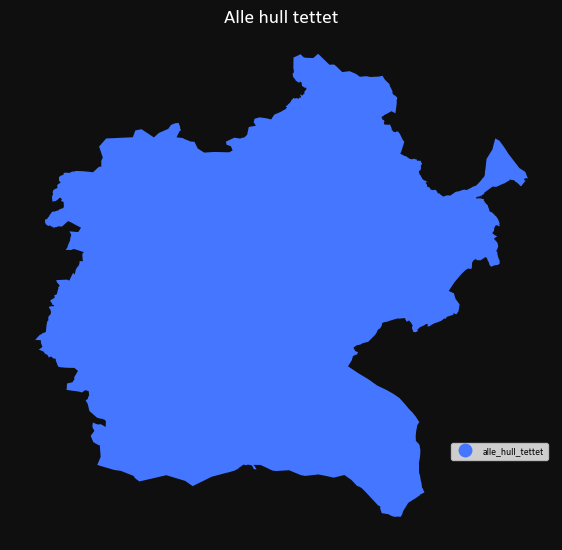

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Alle hull tettet'}>)

In [29]:
alle_hull_tettet = sg.close_holes(polygon_med_to_hull)

sg.qtm(alle_hull_tettet, title="Alle hull tettet", size=7)

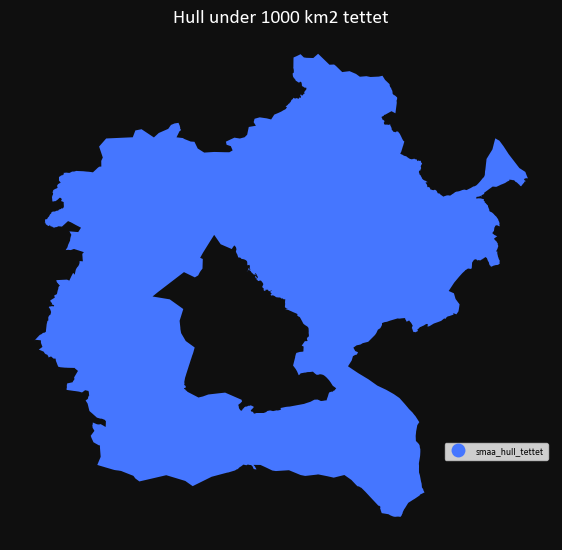

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Hull under 1000 km2 tettet'}>)

In [30]:
smaa_hull_tettet = sg.close_holes(polygon_med_to_hull, max_km2=1000)

sg.qtm(smaa_hull_tettet, title="Hull under 1000 km2 tettet", size=7)

### Repair geometry

Det vil si, hvis man vil reparere, fjerne tomme og manglende geometrier og beholde bare én geometritype (multi- og singlepart). 

False


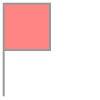

In [31]:
from shapely.geometry import Polygon
invalid_geometry = Polygon([(0,1), (0,0), (0,1),(1,1),(1,2),(0,2),(0,0)])
print(invalid_geometry.is_valid)
invalid_geometry

In [32]:

invalid_geometry = sg.to_gdf(invalid_geometry)

empty_geometry = sg.to_gdf("POINT (0 0)").pipe(sg.buff, 0)

missing_geometry = gpd.GeoDataFrame(
    {"geometry": [None]}, geometry="geometry", crs=25833
)

gdf = sg.gdf_concat([invalid_geometry, missing_geometry, empty_geometry])

gdf["valid"] = gdf.is_valid

gdf

,geometry,valid
0,"POLYGON ((0.000 1.000, 0.000 0.000, 0.000 1.00...",False
1,None,False
2,POLYGON EMPTY,True


Reparering med geopandas:

In [33]:
gdf.make_valid()

0    GEOMETRYCOLLECTION (POLYGON ((0.000 2.000, 1.0...
1                                                 None
2                                        POLYGON EMPTY
dtype: geometry

Man beholder da missing og empty, og får en geometritype som er håpløs å jobbe med:

In [34]:
gdf.make_valid().iloc[0].wkt

'GEOMETRYCOLLECTION (POLYGON ((0 2, 1 2, 1 1, 0 1, 0 2)), LINESTRING (0 1, 0 0))'

Derfor:

In [35]:
sg.clean_geoms(gdf, geom_type="polygon")

,geometry,valid
0,"POLYGON ((0.000 2.000, 1.000 2.000, 1.000 1.00...",False


### Snap punkter

In [36]:
snap_til = sg.buff(punkter.iloc[[0]], 500)

sg.explore(snap_til, punkter)

In [37]:
snappede_punkter = sg.snap_to(punkter, snap_til)

snappede_punkter

,idx,geometry,snap_distance
0,1,POINT (263122.700 6651184.900),499.938316
1,2,POINT (263610.658 6651293.972),9085.684096
2,3,POINT (263606.992 6651309.245),6700.739993
3,4,POINT (262638.408 6651060.555),2923.861947
4,5,POINT (263614.865 6651272.738),9401.327069
...,...,...,...
995,996,POINT (263496.070 6650852.392),4469.295482
996,997,POINT (262816.246 6651579.978),2536.216537
997,998,POINT (263154.095 6650685.887),5273.239780
998,999,POINT (263620.481 6651137.846),5629.354711


In [38]:
sg.explore(snap_til, snappede_punkter, punkter)

In [39]:
snap_til["snap_id"] = snap_til.index
snappede_punkter = sg.snap_to(punkter, snap_til, max_dist=5000, id_col="snap_id")

snappede_punkter

,idx,geometry,snap_distance,snap_id
0,1,POINT (263122.700 6651184.900),499.938316,0.0
1,2,POINT (272456.100 6653369.500),NaN,NaN
2,3,POINT (270082.300 6653032.700),NaN,NaN
3,4,POINT (262638.408 6651060.555),2923.861947,0.0
4,5,POINT (272876.200 6652889.100),NaN,NaN
...,...,...,...,...
995,996,POINT (263496.070 6650852.392),4469.295482,0.0
996,997,POINT (262816.246 6651579.978),2536.216537,0.0
997,998,POINT (263542.900 6645427.000),NaN,NaN
998,999,POINT (269226.700 6650628.000),NaN,NaN


### Finn nærmeste k naboer

In [40]:
sg.get_k_nearest_neighbors(
    punkter, 
    neighbors=punkter, 
    k=5, 
    id_cols=("idx", "idx")
)

,idx,idx_right,distance,distance_min,k
0,1,1,0.000000,0.0,1.0
1,1,318,209.952471,0.0,2.0
2,1,136,211.000592,0.0,3.0
3,1,176,319.277826,0.0,4.0
4,1,675,360.063217,0.0,5.0
...,...,...,...,...,...
4995,1000,1000,0.000000,0.0,1.0
4996,1000,95,43.832066,0.0,2.0
4997,1000,256,143.108665,0.0,3.0
4998,1000,400,156.383791,0.0,4.0


### Forenkling av geopandas-kode

Hvis man vil bufre uten å overskrive originaldata, og slå sammen overlappende polygoner basert på flere kolonner:

In [41]:
# buffer
kopi = kommuner.copy()
kopi["geometry"] = kopi.buffer(100, resolution=50)
kopi["geometry"] = kopi["geometry"].make_valid()

# dissolve
dissolvet = kopi.dissolve(by=["KOMMUNENR", "FYLKE"])
dissolvet["geometry"] = dissolvet["geometry"].make_valid()
kolonnenavn_gjenerobret = dissolvet.reset_index()

#explode
singlepart = kolonnenavn_gjenerobret.explode(ignore_index=True)

Eller:

In [42]:
singlepart2 = sg.buffdissexp(kommuner, 100, by=["KOMMUNENR", "FYLKE"])

In [43]:
singlepart.equals(singlepart2)

True

In [45]:
sg.buff(kommuner, 100)

,KOMMUNENR,FYLKE,geometry
0,1560,15,"POLYGON ((137831.299 7007464.474, 137829.102 7..."
1,1563,15,"POLYGON ((159058.302 6950819.619, 158016.929 6..."
2,1566,15,"POLYGON ((159121.328 7005852.196, 159122.331 7..."
3,1573,15,"POLYGON ((106938.443 7057560.839, 106936.227 7..."
4,1576,15,"POLYGON ((167329.808 7043000.192, 167331.953 7..."
...,...,...,...
351,5433,54,"POLYGON ((726362.754 7865472.379, 726361.411 7..."
352,5434,54,"POLYGON ((795965.813 7918313.530, 795963.835 7..."
353,5435,54,"POLYGON ((880851.236 7903952.258, 878037.873 7..."
354,5436,54,"POLYGON ((860048.700 7835011.904, 861019.834 7..."


In [46]:
sg.diss(kommuner, by="FYLKE")

,FYLKE,geometry,KOMMUNENR
0,03,"POLYGON ((248657.280 6661909.960, 248685.810 6...",0301
1,11,"POLYGON ((-56493.690 6508636.440, -59095.100 6...",1101
2,15,"POLYGON ((104161.500 6907210.720, 104544.500 6...",1560
3,18,"POLYGON ((355569.960 7222811.560, 355387.970 7...",1804
4,30,"POLYGON ((181826.290 6633764.430, 181829.230 6...",3001
5,34,"POLYGON ((189999.140 6740694.890, 189997.490 6...",3401
6,38,"POLYGON ((187026.350 6607473.790, 187031.200 6...",3801
7,42,"POLYGON ((74935.480 6428254.040, 74211.540 642...",4206
8,46,"POLYGON ((-32673.700 6646701.810, -32756.210 6...",4601
9,50,"POLYGON ((203843.060 6950391.560, 203842.900 6...",5001


In [47]:
sg.dissexp(kommuner)

,KOMMUNENR,FYLKE,geometry
0,1560,15,"POLYGON ((-2346.470 6446307.800, -3205.780 644..."


In [48]:
sg.buffdiss(kommuner, 100, by="FYLKE")

,FYLKE,geometry,KOMMUNENR
0,03,"POLYGON ((248563.736 6661874.610, 248562.678 6...",0301
1,11,"POLYGON ((-54116.885 6504826.326, -56577.335 6...",1101
2,15,"POLYGON ((104306.314 6907216.910, 104610.337 6...",1560
3,18,"POLYGON ((355339.271 7219435.910, 355102.752 7...",1804
4,30,"POLYGON ((181888.067 6633648.803, 181834.997 6...",3001
5,34,"POLYGON ((189908.458 6740638.635, 189906.525 6...",3401
6,38,"POLYGON ((163565.412 6541879.361, 163562.863 6...",3801
7,42,"POLYGON ((77278.528 6428849.472, 74964.098 642...",4206
8,46,"POLYGON ((-29481.600 6655233.190, -29481.644 6...",4601
9,50,"POLYGON ((198886.053 6972152.985, 199000.063 6...",5001
